In [5]:
from tomoSegmentPipeline.utils.common import read_array
from tomoSegmentPipeline.utils import setup

PARENT_PATH = setup.PARENT_PATH
ISONET_PATH = os.path.join(PARENT_PATH, 'data/isoNet/')

import numpy as np
import matplotlib.pyplot as plt
import random
import mrcfile
import pandas as pd
import torch
import os
from glob import glob

def clip_values(tomo_data, low=0.005, high=0.995):
    aux = np.clip(tomo_data, np.quantile(tomo_data, low), np.quantile(tomo_data, high))
    return aux

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Intermediate results

## Salmonella

In [2]:
results_path = os.path.join(PARENT_PATH, 'data/isoNet/salmonella_dataset/results/')
files = glob(results_path+'20200213_GW214_tgt4_ali_000077_iter*')
# sorted(files)

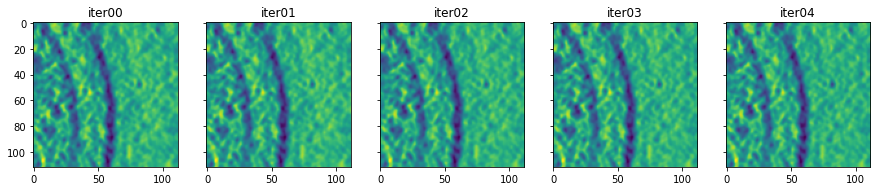

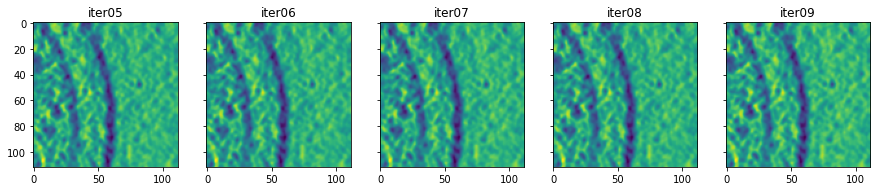

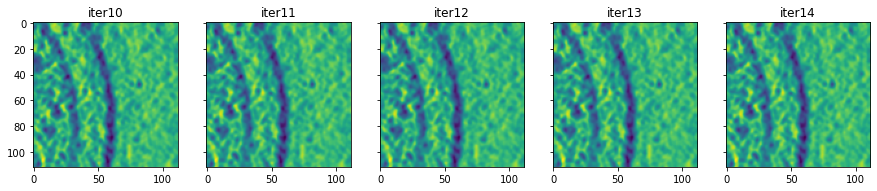

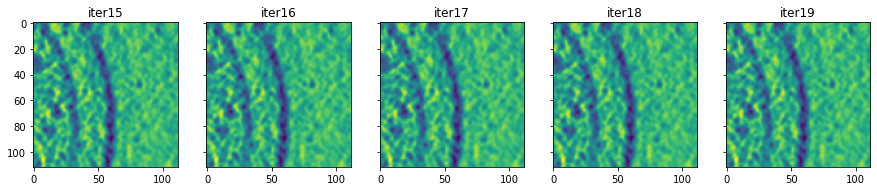

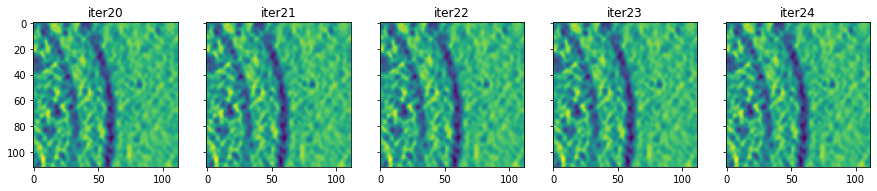

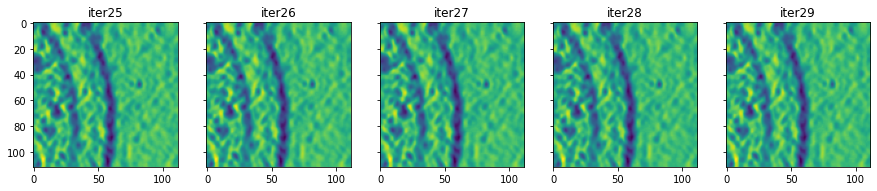

In [23]:
# 37, 67, 95, 13, 30
results_path = os.path.join(PARENT_PATH, 'data/isoNet/salmonella_dataset/results/')
minipatch_file = os.path.join(results_path, '20200213_GW214_tgt4_ali_000090_%s.mrc')

fig, ax = plt.subplots(1, 5, figsize=(15,10), sharey=True)

for i in range(30):
    iter_no = 'iter%02d'%i
    aux_file = minipatch_file %iter_no
    minipatch = read_array(aux_file)
    z_idx = minipatch.shape[0]//2
    rowcount = i%5
    
    if rowcount==0 and i>0:
        plt.show()
        fig, ax = plt.subplots(1, 5, figsize=(15,10), sharey=True)
        ax[rowcount].imshow(minipatch[z_idx])
        ax[rowcount].set_title(iter_no)
    else:
        ax[rowcount].imshow(minipatch[z_idx])
        ax[rowcount].set_title(iter_no)

In [21]:
# fig, ax = plt.subplots(1, 2, figsize=(15,10), sharey=True)

# for i, j in enumerate([0, 30]):
#     iter_no = 'iter%02d'%j
#     aux_file = minipatch_file %iter_no
#     minipatch = read_array(aux_file)
#     z_idx = minipatch.shape[0]//2
    
#     ax[i].imshow(minipatch[z_idx])

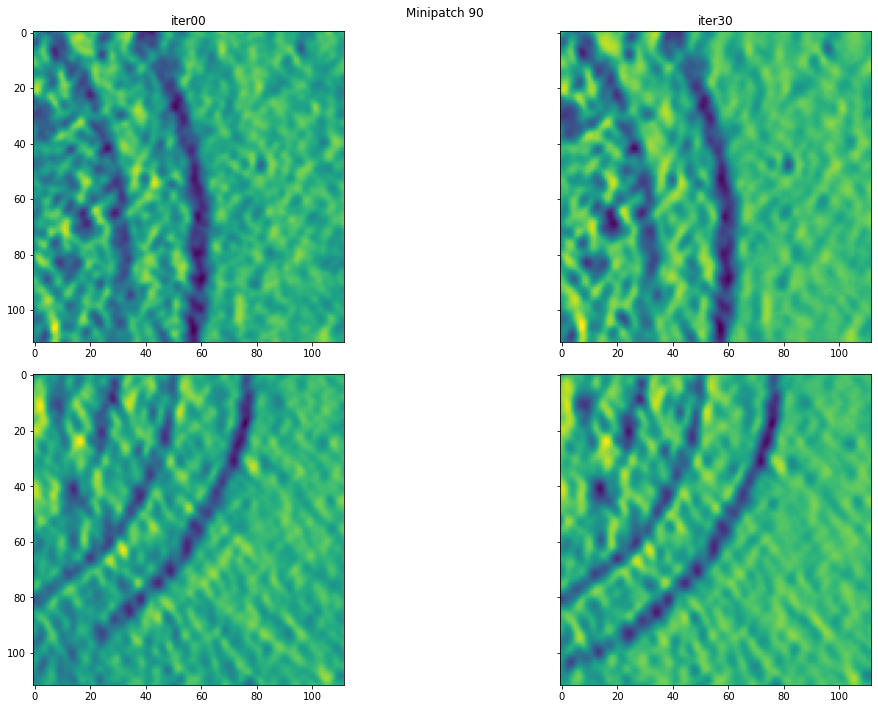

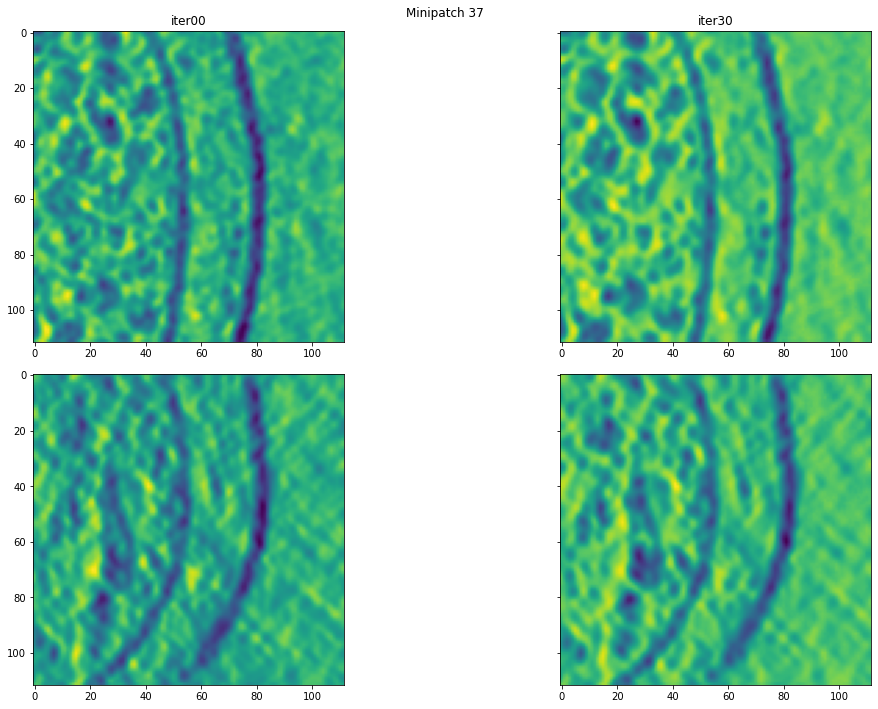

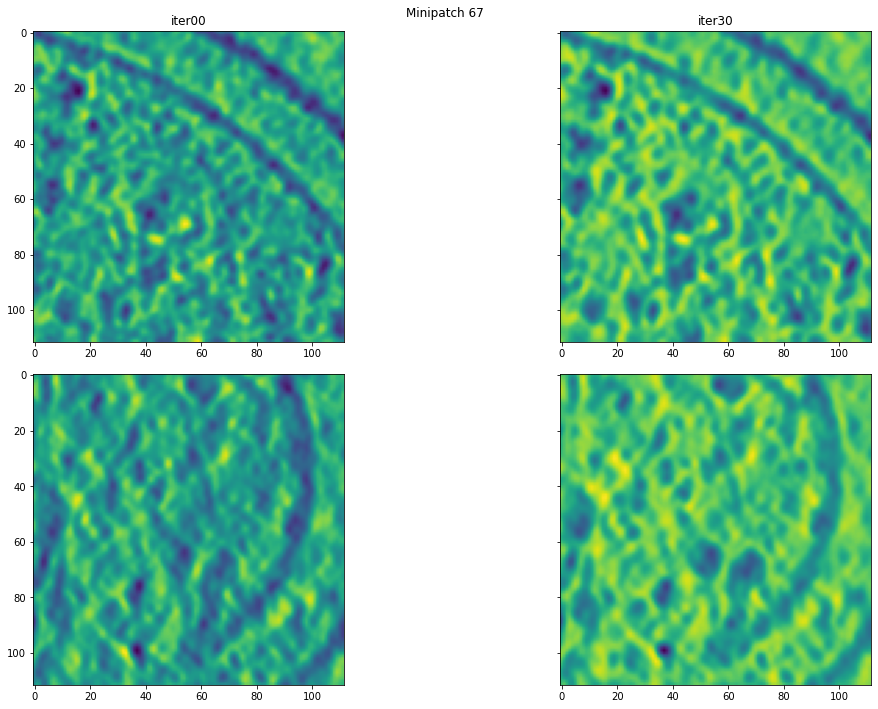

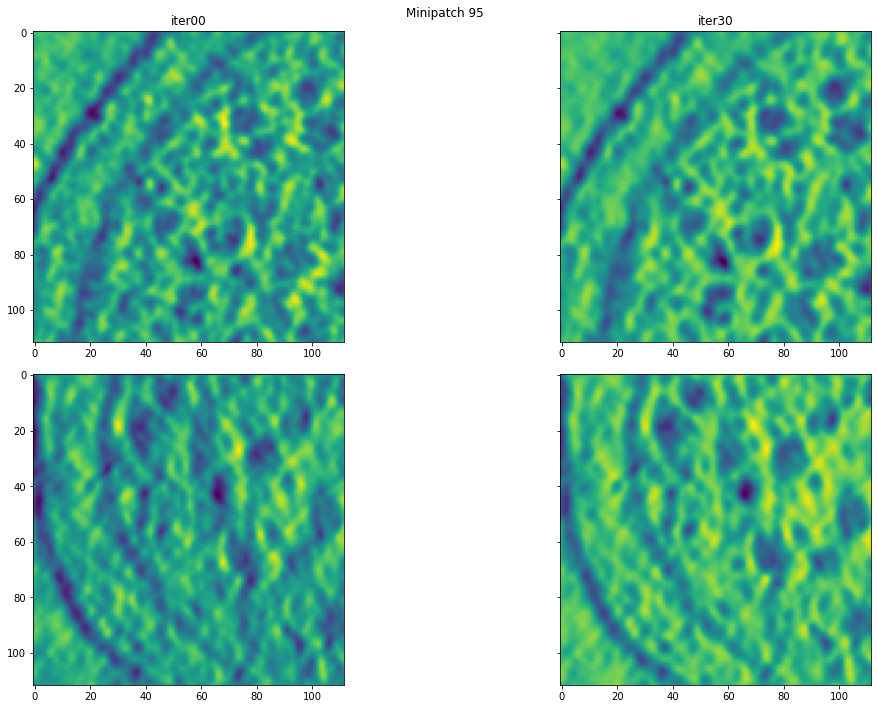

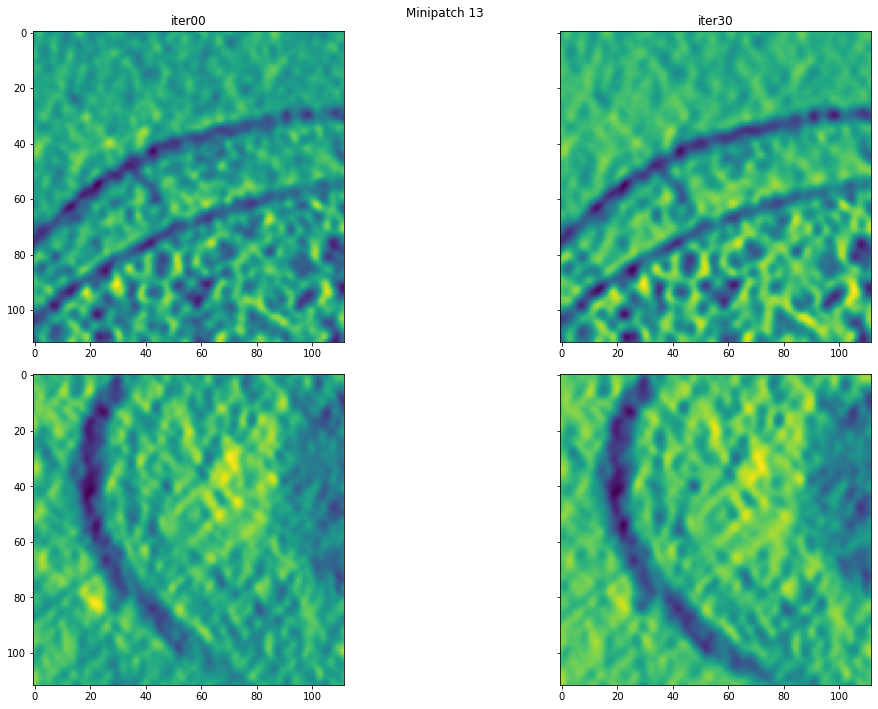

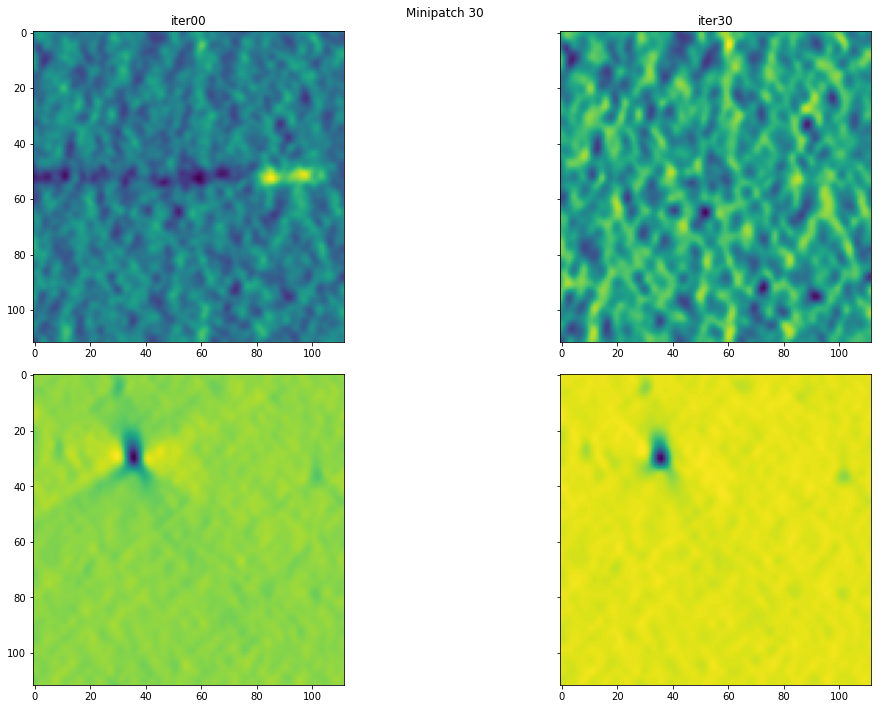

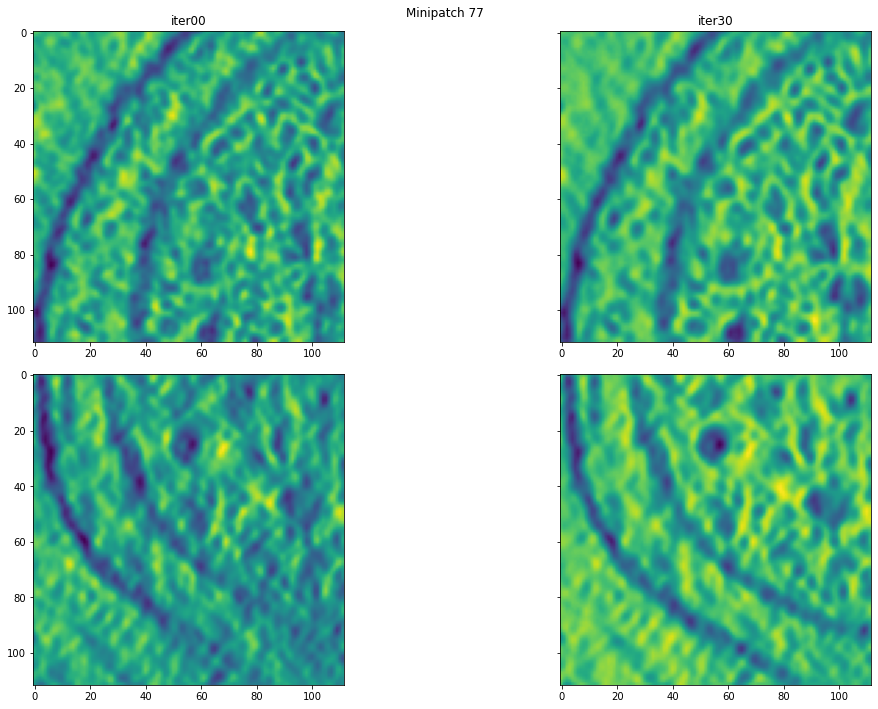

In [12]:
results_path = os.path.join(PARENT_PATH, 'data/isoNet/salmonella_dataset/results/')

# for k in random.sample(range(0, 100), 10):
for k in [90, 37, 67, 95, 13, 30, 77]:

    minipatch_file = os.path.join(results_path, '20200213_GW214_tgt4_ali_0000%02d_%s.mrc')

    fig, ax = plt.subplots(2, 2, figsize=(15,10), sharey=True)
    fig.suptitle('Minipatch %02d' %k)
    fig.tight_layout()
    # fig.subplots_adjust(top=0.88)

    for i, j in enumerate([0, 30]):
        iter_no = 'iter%02d'%j
        aux_file = minipatch_file %(k, iter_no)
        minipatch = read_array(aux_file)
        z_idx = minipatch.shape[0]//2
        y_idx = minipatch.shape[0]//2
        
        ax[0][i].imshow(minipatch[z_idx])
        ax[0][i].set_title(iter_no)
        
        ax[1][i].imshow(minipatch[:, y_idx, :])
        
    plt.show()

## Membranes

In [20]:
results_path = os.path.join(PARENT_PATH, 'data/isoNet/RAW_dataset/RAW_results/')
files = glob(results_path+'tomo32*')
# sorted(files)

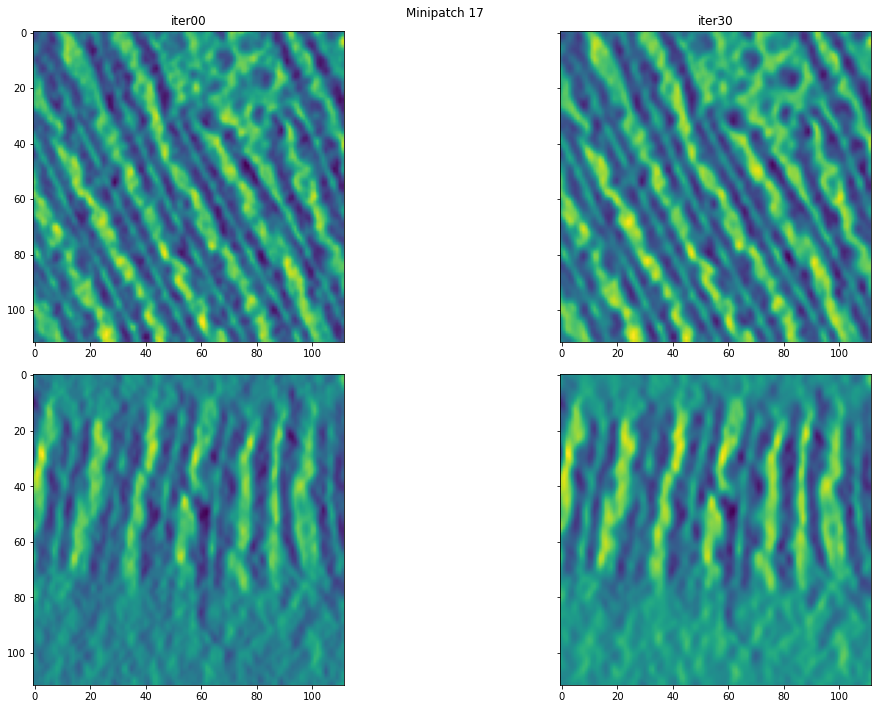

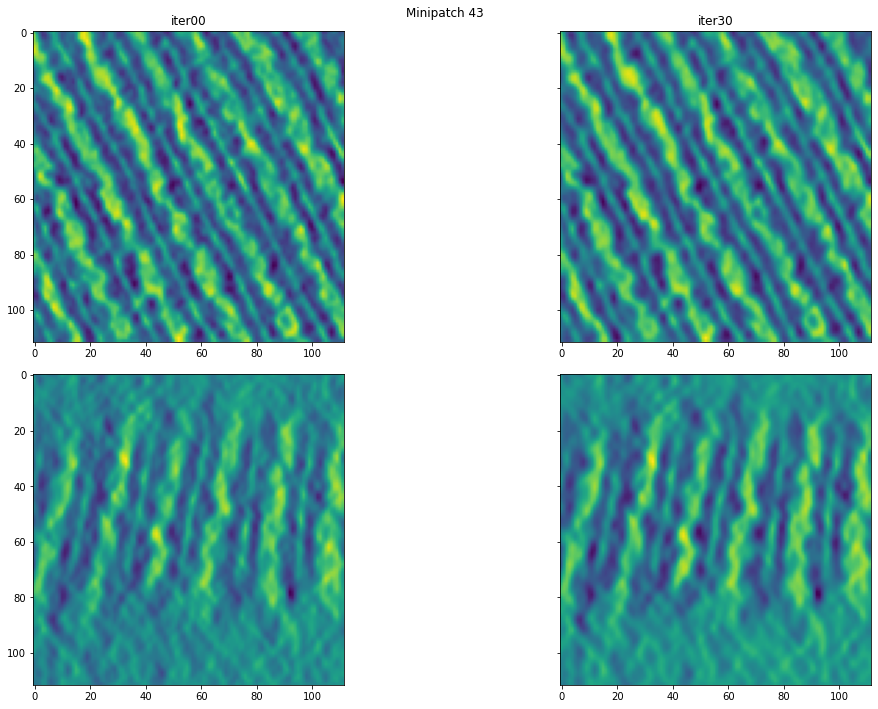

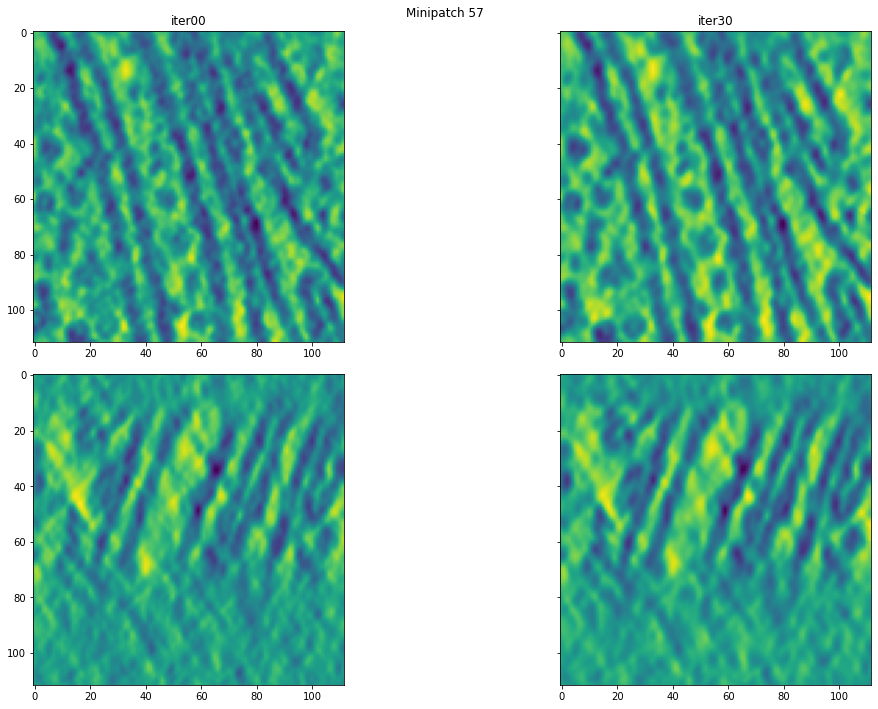

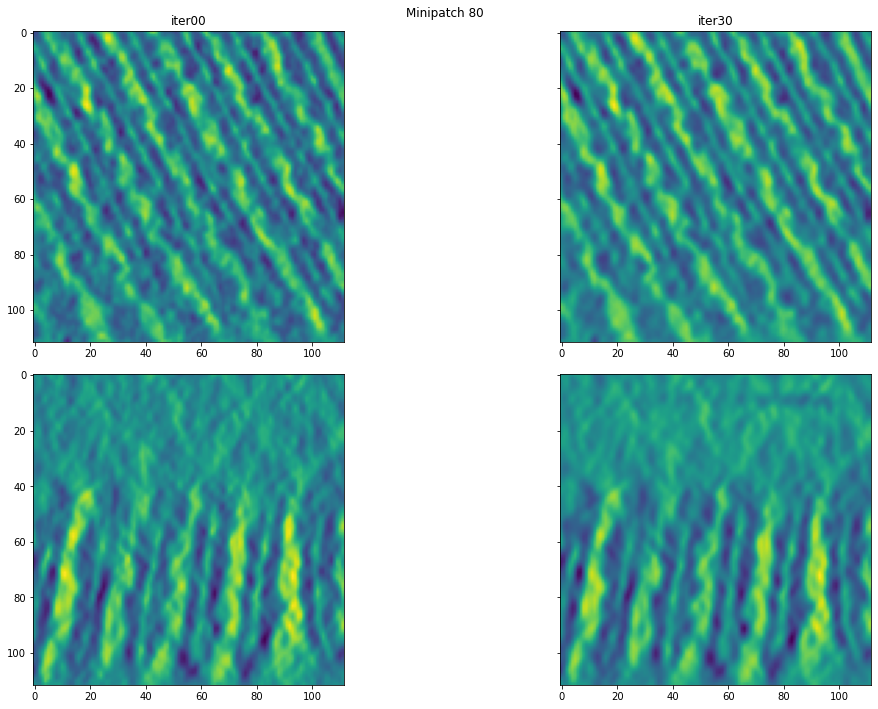

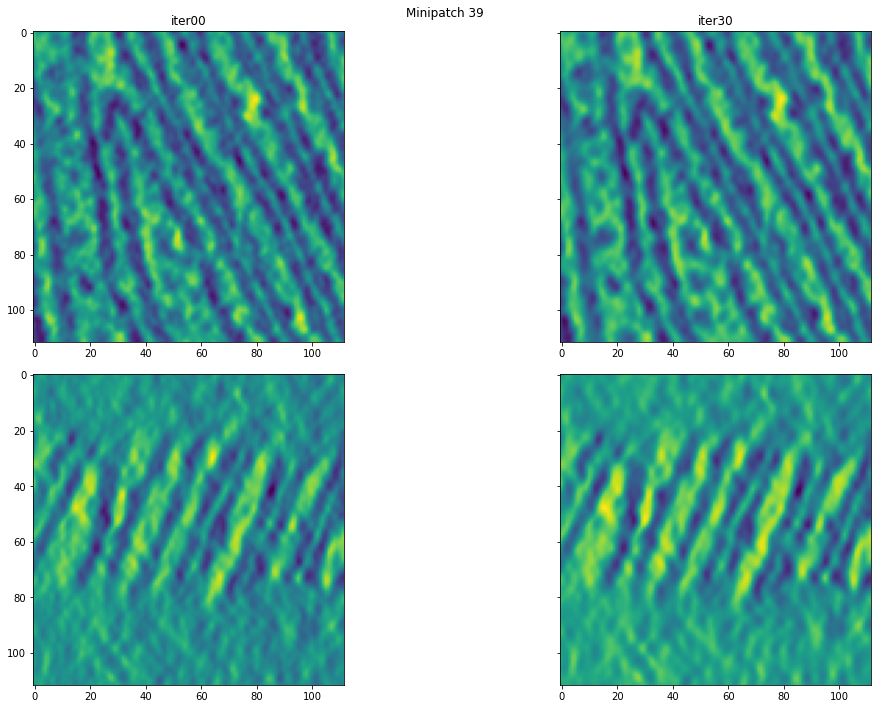

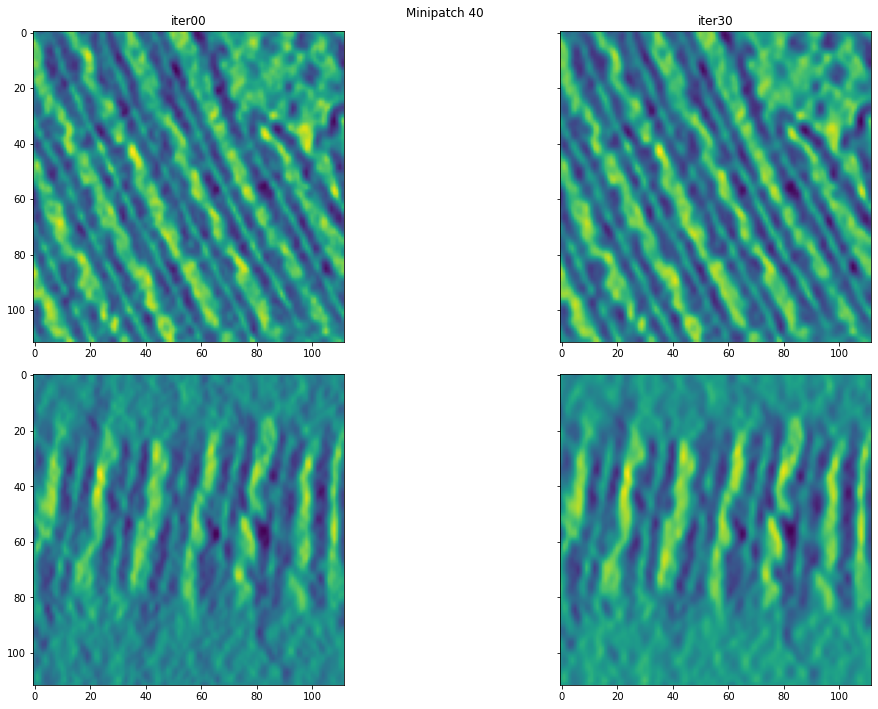

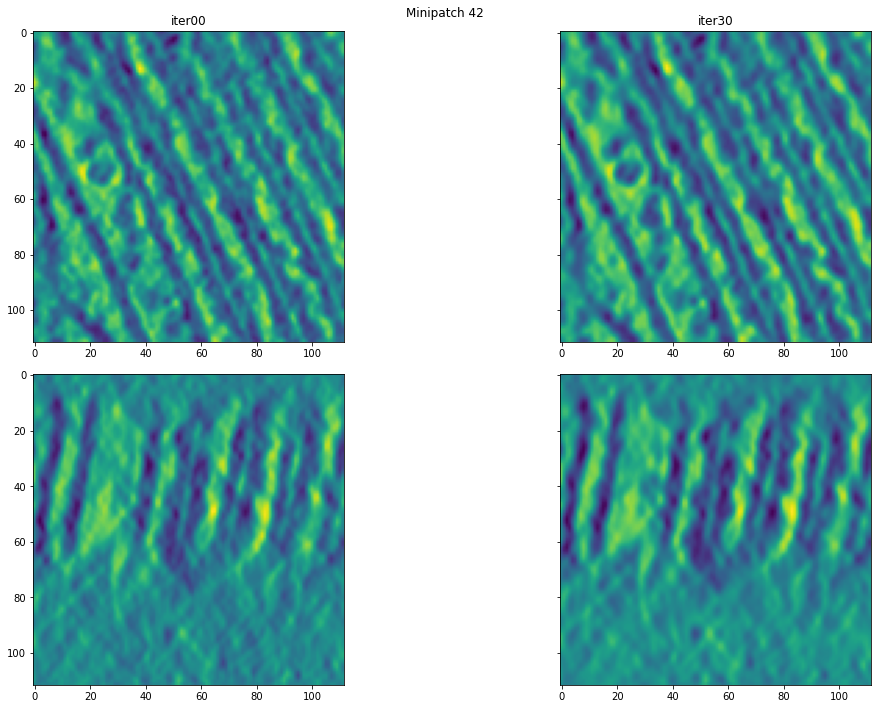

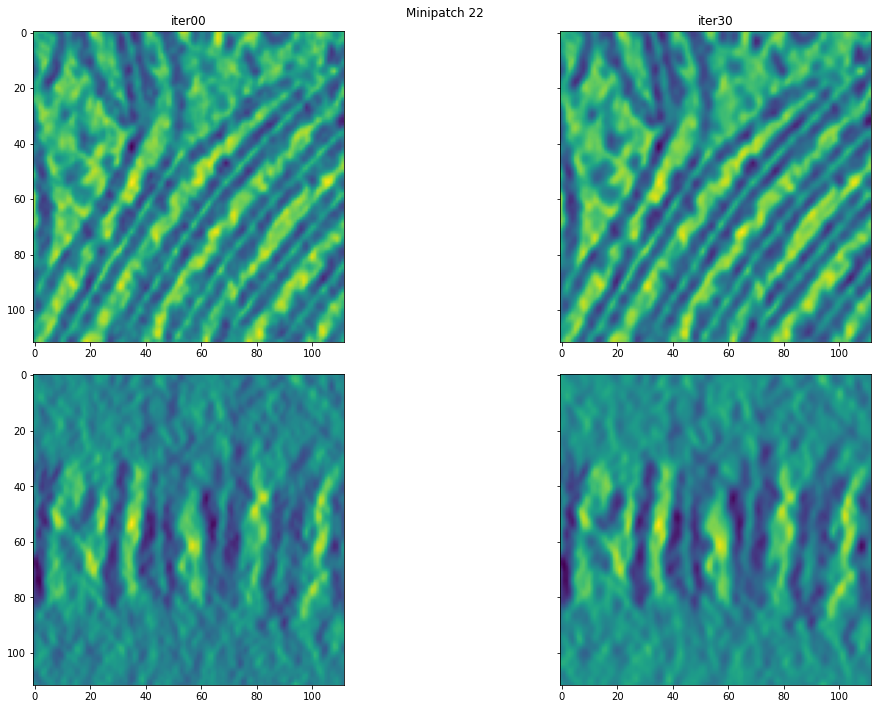

In [19]:
results_path = os.path.join(PARENT_PATH, 'data/isoNet/RAW_dataset/RAW_results/')

# for k in random.sample(range(0, 100), 10):
for k in [17, 43, 57, 80, 39, 40, 42, 22]:
    
    minipatch_file = os.path.join(results_path, 'tomo32_0000%02d_%s.mrc')

    fig, ax = plt.subplots(2, 2, figsize=(15,10), sharey=True)
    fig.suptitle('Minipatch %02d' %k)
    fig.tight_layout()
    # fig.subplots_adjust(top=0.88)

    for i, j in enumerate([0, 30]):
        iter_no = 'iter%02d'%j
        aux_file = minipatch_file %(k, iter_no)
        minipatch = read_array(aux_file)
        z_idx = minipatch.shape[0]//2
        y_idx = minipatch.shape[0]//2
        
        ax[0][i].imshow(minipatch[z_idx])
        ax[0][i].set_title(iter_no)
        
        ax[1][i].imshow(minipatch[:, y_idx, :])
        
    plt.show()

# Overview of Workflow stages

## Salmonella

reading raw...
reading deconv...
reading mask...
reading corrected...


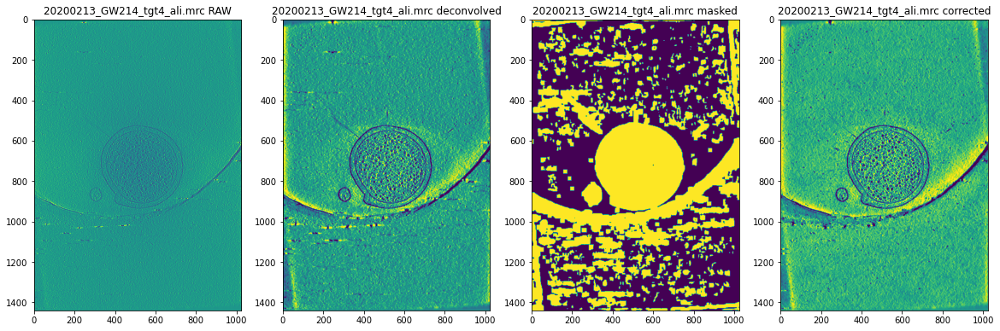

In [6]:
# --snrfalloff 1 --deconvstrength 1

raw_tomo_path = os.path.join(ISONET_PATH, 'salmonella_dataset/salmonella_minicells/')
deconv_tomo_path = os.path.join(ISONET_PATH, 'salmonella_dataset/tomos_deconv/')
mask_tomo_path = os.path.join(ISONET_PATH, 'salmonella_dataset/tomos_mask/')
corrected_tomo_path = os.path.join(ISONET_PATH, 'salmonella_dataset/corrected_i30/')

isonet_training_tomos = ['20200213_GW214_tgt4_ali.mrc']


for tomo in sorted(isonet_training_tomos):
    print('reading raw...')
    raw_data = clip_values(read_array(os.path.join(raw_tomo_path, tomo)))
    
    print('reading deconv...')
    deconv_data = clip_values(read_array(os.path.join(deconv_tomo_path, tomo)))
    
    print('reading mask...')
    masked_data = read_array(os.path.join(mask_tomo_path, tomo[0:-4]+'_mask.mrc'))
    
    print('reading corrected...')
    corrected_data = clip_values(read_array(os.path.join(corrected_tomo_path, tomo[0:-4]+'_corrected.mrc')))
    
    fig, ax = plt.subplots(1, 4, figsize=(20, 15))
        
    z_idx = raw_data.shape[0]//2
    ax[0].imshow(raw_data[z_idx])
    ax[0].set_title(tomo + ' RAW')
    ax[1].imshow(deconv_data[z_idx])
    ax[1].set_title(tomo + ' deconvolved')
    ax[2].imshow(masked_data[z_idx])
    ax[2].set_title(tomo + ' masked')
    ax[3].imshow(corrected_data[z_idx])
    ax[3].set_title(tomo + ' corrected')
    
    plt.show()

Text(0.5, 1.0, '20200213_GW214_tgt4_ali.mrc corrected')

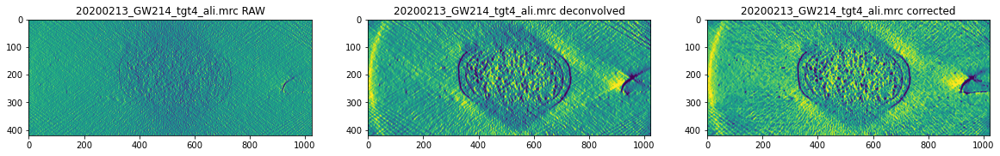

In [9]:
# It doesnt seem to be any correction going on
fig, ax = plt.subplots(1, 3, figsize=(20, 20))

y_idx = raw_data.shape[1]//2
ax[0].imshow(raw_data[:, y_idx, :])
ax[0].set_title(tomo + ' RAW')
ax[1].imshow(deconv_data[:, y_idx, :])
ax[1].set_title(tomo + ' deconvolved')
ax[2].imshow(corrected_data[:, y_idx, :])
ax[2].set_title(tomo + ' corrected')

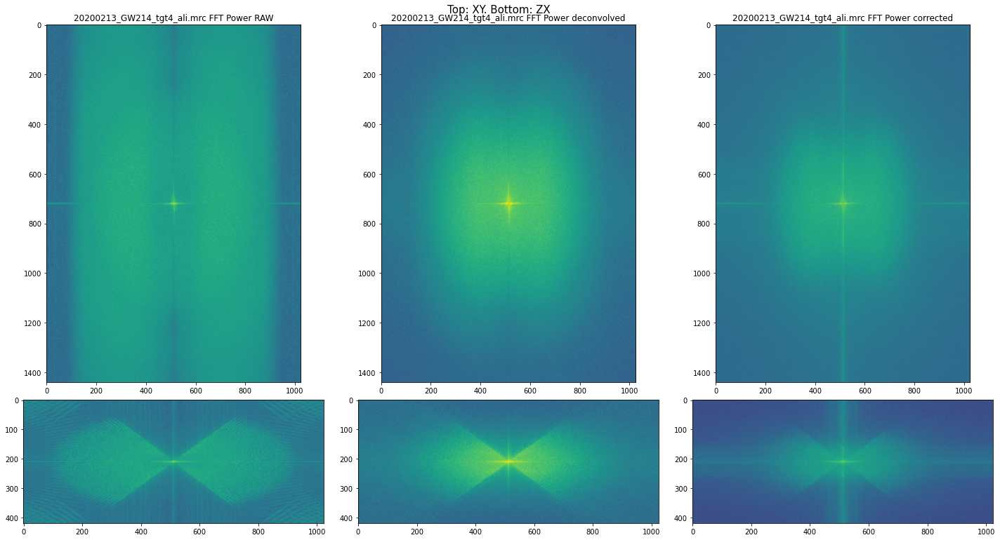

In [3]:
tomo_shape = raw_data.shape

subtomo_raw_fft = np.fft.fftn(raw_data)
log_power_raw = np.log(np.abs(np.fft.fftshift(subtomo_raw_fft))**2)

subtomo_deconv_fft = np.fft.fftn(deconv_data)
log_power_deconv = np.log(np.abs(np.fft.fftshift(subtomo_deconv_fft))**2)

subtomo_corrected_fft = np.fft.fftn(corrected_data)
log_power_corrected = np.log(np.abs(np.fft.fftshift(subtomo_corrected_fft))**2)

fig, ax = plt.subplots(2, 3, figsize=(20, 13))
        
fig.suptitle('Top: XY. Bottom: ZX', fontsize=15)    

z_idx = raw_data.shape[0]//2
ax[0][0].imshow(log_power_raw[tomo_shape[0]//2])
ax[0][0].set_title(tomo + ' FFT Power RAW')
ax[0][1].imshow(log_power_deconv[tomo_shape[0]//2])
ax[0][1].set_title(tomo + ' FFT Power deconvolved')
ax[0][2].imshow(log_power_corrected[tomo_shape[0]//2])
ax[0][2].set_title(tomo + ' FFT Power corrected')

ax[1][0].imshow(log_power_raw[:, tomo_shape[1]//2, :])
ax[1][1].imshow(log_power_deconv[:, tomo_shape[1]//2, :])
ax[1][2].imshow(log_power_corrected[:, tomo_shape[1]//2, :])

plt.subplots_adjust(hspace = -0.5)
plt.tight_layout()
plt.show()

## Membranes

reading raw...
reading deconv...
reading mask...
reading corrected...


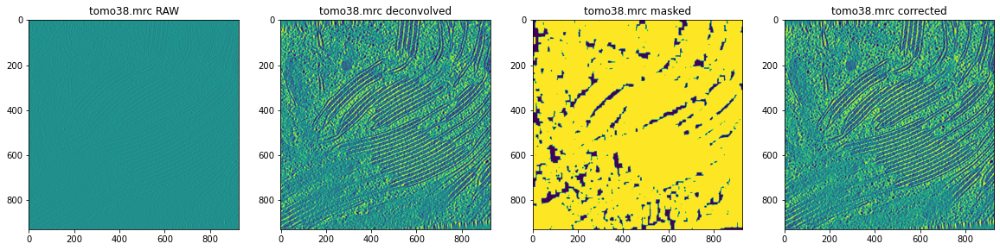

In [6]:
# --snrfalloff 1 --deconvstrength 1

raw_tomo_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_tomoset/')
deconv_tomo_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_tomos_deconv/')
mask_tomo_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_tomos_mask/')
corrected_tomo_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_corrected_i30/')

# isonet_training_tomos = ['tomo10.mrc', 'tomo04.mrc', 'tomo32.mrc', 'tomo38.mrc']
isonet_training_tomos = ['tomo38.mrc']

for tomo in sorted(isonet_training_tomos):
    print('reading raw...')
    raw_data = clip_values(read_array(os.path.join(raw_tomo_path, tomo)))
    
    print('reading deconv...')
    deconv_data = clip_values(read_array(os.path.join(deconv_tomo_path, tomo)))
    
    print('reading mask...')
    masked_data = read_array(os.path.join(mask_tomo_path, tomo[0:-4]+'_mask.mrc'))
    
    print('reading corrected...')
    corrected_data = clip_values(read_array(os.path.join(corrected_tomo_path, tomo[0:-4]+'_corrected.mrc')))
    
    fig, ax = plt.subplots(1, 4, figsize=(20, 15))
        
    z_idx = raw_data.shape[0]//2
    ax[0].imshow(raw_data[z_idx])
    ax[0].set_title(tomo + ' RAW')
    ax[1].imshow(deconv_data[z_idx])
    ax[1].set_title(tomo + ' deconvolved')
    ax[2].imshow(masked_data[z_idx])
    ax[2].set_title(tomo + ' masked')
    ax[3].imshow(corrected_data[z_idx])
    ax[3].set_title(tomo + ' corrected')
    
    plt.show()
    break

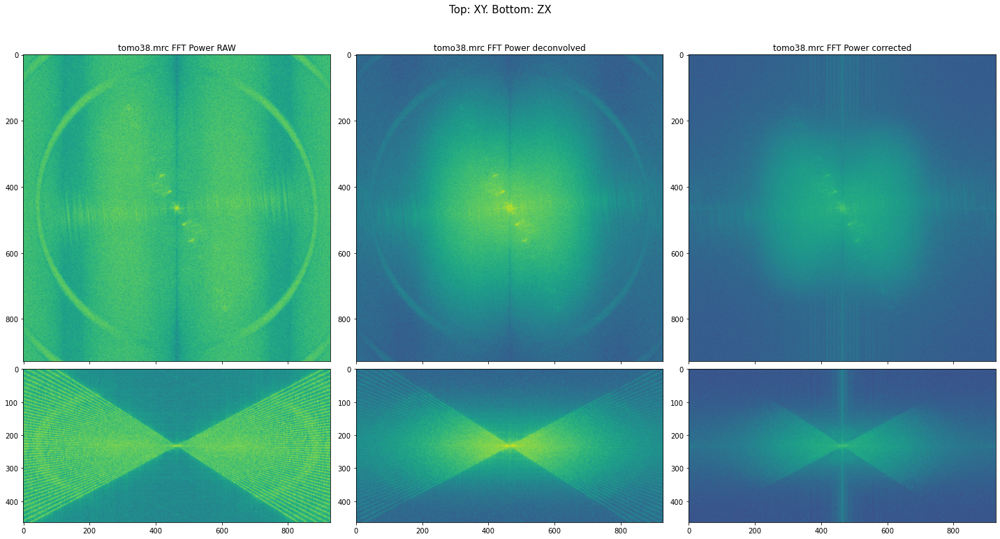

In [7]:
tomo_shape = raw_data.shape

subtomo_raw_fft = np.fft.fftn(raw_data)
log_power_raw = np.log(np.abs(np.fft.fftshift(subtomo_raw_fft))**2)

subtomo_deconv_fft = np.fft.fftn(deconv_data)
log_power_deconv = np.log(np.abs(np.fft.fftshift(subtomo_deconv_fft))**2)

subtomo_corrected_fft = np.fft.fftn(corrected_data)
log_power_corrected = np.log(np.abs(np.fft.fftshift(subtomo_corrected_fft))**2)

fig, ax = plt.subplots(2, 3, figsize=(20, 13), sharex=True)
        
fig.suptitle('Top: XY. Bottom: ZX', fontsize=15)    

z_idx = raw_data.shape[0]//2
ax[0][0].imshow(log_power_raw[tomo_shape[0]//2])
ax[0][0].set_title(tomo + ' FFT Power RAW')
ax[0][1].imshow(log_power_deconv[tomo_shape[0]//2])
ax[0][1].set_title(tomo + ' FFT Power deconvolved')
ax[0][2].imshow(log_power_corrected[tomo_shape[0]//2])
ax[0][2].set_title(tomo + ' FFT Power corrected')

ax[1][0].imshow(log_power_raw[:, tomo_shape[1]//2, :])
ax[1][1].imshow(log_power_deconv[:, tomo_shape[1]//2, :])
ax[1][2].imshow(log_power_corrected[:, tomo_shape[1]//2, :])

plt.subplots_adjust(hspace = -0.5)
plt.tight_layout()
plt.show()